<a href="https://colab.research.google.com/github/albinstein/AlmacenamientoDatos1/blob/master/Proyecto_Final_Analisis_de_Datos_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<b><h2>Predicción de precio de cierre de BTC vs USDT</h2></b>


Albin Rivera Paja

**Pregunta SMART**
Es posible predecir con un 90% de asertividad el precio de cierre ("close") de BTC  para el 30 de agosto de 2024.


**Descripción del problema**

En el contexto de las finanzas y la inversión en criptomonedas, una de las mayores incertidumbres a la que se enfrenta un inversionista es a la volatilidad del mercado. Bitcoin (BTC), siendo una de las criptomonedas más influyentes, presenta fluctuaciones de precios significativas que pueden tener un impacto considerable en la rentabilidad de las inversiones. Ante este escenario, surge la necesidad de prever el comportamiento futuro del precio de cierre de BTC para periodos específicos.  Por lo tanto, la capacidad de realizar predicciones precisas podría no solo ayudar al inversionista a optimizar sus estrategias de compra y venta, sino también a mitigar riesgos financieros.


**Diccionario de datos**

<b>CLOSE</b>: Precio de cierre del activo financiero, de tipo float64.

<b>VOLUME</b>: Cantidad de unidades vendidas y compradas en un lapso de tiempo, de tipo float64.

**Carga de Librerias**

In [ ]:
!pip install prophet

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler, Normalizer, MaxAbsScaler
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFE
from sklearn.model_selection import train_test_split
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from prophet import Prophet
from prophet.diagnostics import cross_validation, performance_metrics
from statsmodels.tools.eval_measures import rmse
from prophet.plot import plot_plotly, plot_components_plotly

**Carga de base de datos y creación de variable fecha**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

path_data = "https://raw.githubusercontent.com/albinstein/AlmacenamientoDatos1/master/Data/Bronce.precio_BTCUSDT_4h_Binance.csv"


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df = pd.read_csv(path_data)[['timestamp','close', 'volume']]
df['fecha'] = pd.to_datetime(df['timestamp'], unit='ms')
df

,timestamp,close,volume,fecha
0,1502956800000,4427.30,63.619882,2017-08-17 08:00:00
1,1502971200000,4352.34,174.562001,2017-08-17 12:00:00
2,1502985600000,4325.23,225.109716,2017-08-17 16:00:00
3,1503000000000,4285.08,249.769913,2017-08-17 20:00:00
4,1503014400000,4292.39,276.193043,2017-08-18 00:00:00
...,...,...,...,...
15340,1723867200000,59248.00,1106.844530,2024-08-17 04:00:00
15341,1723881600000,59137.12,1327.011360,2024-08-17 08:00:00
15342,1723896000000,59388.11,1490.864120,2024-08-17 12:00:00
15343,1723910400000,59473.19,1157.010550,2024-08-17 16:00:00


**Exploración de datos**

In [ ]:
# Identificar la cantidad de columnas y filas del dataframe
df.shape

(15345, 4)

In [ ]:
#Visualizar las primeras 5 filas del dataframe
df.head()

,timestamp,close,volume,fecha
0,1502956800000,4427.30,63.619882,2017-08-17 08:00:00
1,1502971200000,4352.34,174.562001,2017-08-17 12:00:00
2,1502985600000,4325.23,225.109716,2017-08-17 16:00:00
3,1503000000000,4285.08,249.769913,2017-08-17 20:00:00
4,1503014400000,4292.39,276.193043,2017-08-18 00:00:00


In [ ]:
#Visualizar las últimas 5 filas del dataframe
df.tail()

,timestamp,close,volume,fecha
15340,1723867200000,59248.00,1106.84453,2024-08-17 04:00:00
15341,1723881600000,59137.12,1327.01136,2024-08-17 08:00:00
15342,1723896000000,59388.11,1490.86412,2024-08-17 12:00:00
15343,1723910400000,59473.19,1157.01055,2024-08-17 16:00:00
15344,1723924800000,59306.24,472.29437,2024-08-17 20:00:00


In [ ]:
# Identificar el tipo de dato de df
df.dtypes

,0
timestamp,int64
close,float64
volume,float64
fecha,datetime64[ns]


**Busqueda y tratamiento de datos duplicados**

In [ ]:
#Verificar duplicidad en los datos
num_duplicados = df.duplicated(subset='fecha').sum()
print(f"Cantidad de datos duplicados: {num_duplicados}")

Cantidad de datos duplicados: 15


Debido a que se identifican 15 datos duplicados en el dataframe, se procede a verificar una muestra de dichos duplicados:

In [ ]:
# Verificar y mostrar una muestra de los datos duplicados
duplicados = df[df.duplicated(subset='fecha', keep=False)]
print("Datos duplicados:")
duplicados.head()  # Mostrar las primeras filas de los datos duplicados

Datos duplicados:


,timestamp,close,volume,fecha
999,1517342400000,10237.51,4737.906346,2018-01-30 20:00:00
1000,1517342400000,10237.51,4737.906346,2018-01-30 20:00:00
1999,1531872000000,7457.03,9867.367577,2018-07-18 00:00:00
2000,1531872000000,7457.03,9867.367577,2018-07-18 00:00:00
2999,1546272000000,3687.47,6179.613282,2018-12-31 16:00:00


Ahora se procede a eliminar los duplicados para limpiar el dataframe:

In [ ]:
# Eliminar duplicados a partir de la columna fecha
df.drop_duplicates(subset='fecha', inplace=True)

Se verifica que efectivamente se haya eliminado los duplicados:

In [ ]:
#Verificar duplicidad en los datos
num_duplicados = df.duplicated(subset='fecha').sum()
print(f"Cantidad de datos duplicados: {num_duplicados}")

Cantidad de datos duplicados: 0


**Identifiación y Tratamiento de datos unicos y faltantes**

Es importante asegurarse de como se comportan los datos en el dataframe, es decir si contamos con valores unicos o caso contrario vemos repetición de datos en el mismo, de acuerdo a lo siguiente, se puede evidenciar que en general todos los datos tienden a ser unicos, sin embargo como era de esperarse se pueden repetir datos en las variables open, high, low y close ya que el comportamiento del activo puede tomar un mismo valor n veces.

In [ ]:
#Identificar datos unicos
df.nunique()

,0
timestamp,15330
close,15211
volume,15330
fecha,15330


Con lo anterior tambien podemos identificar la existencia de datos faltantes, lo cual sera verificado a continuación:

In [ ]:
# Identificar datos faltantes
df.set_index('fecha', inplace=True)  # Establecer timestamp como índice
df = df.resample('4h').asfreq()  # Re-samplear a intervalos de 4 horas
missing_data = df[df.isnull().any(axis=1)]  # Filtrar filas con datos faltantes

print("Datos faltantes:")
print(missing_data)

# Imprimir la cantidad total de filas con datos faltantes
print("\nCantidad total de filas con datos faltantes:", missing_data.shape[0])

Datos faltantes:
                     timestamp  close  volume
fecha                                        
2018-02-08 04:00:00        NaN    NaN     NaN
2018-02-08 08:00:00        NaN    NaN     NaN
2018-02-08 12:00:00        NaN    NaN     NaN
2018-02-08 16:00:00        NaN    NaN     NaN
2018-02-08 20:00:00        NaN    NaN     NaN
2018-02-09 00:00:00        NaN    NaN     NaN
2018-02-09 04:00:00        NaN    NaN     NaN
2018-06-26 04:00:00        NaN    NaN     NaN
2018-06-26 08:00:00        NaN    NaN     NaN
2018-07-04 04:00:00        NaN    NaN     NaN
2018-11-14 04:00:00        NaN    NaN     NaN
2019-03-12 04:00:00        NaN    NaN     NaN
2019-05-15 04:00:00        NaN    NaN     NaN
2019-05-15 08:00:00        NaN    NaN     NaN
2019-08-15 04:00:00        NaN    NaN     NaN
2020-02-19 12:00:00        NaN    NaN     NaN

Cantidad total de filas con datos faltantes: 16


Efectivamente se identifica la ausencia de 16 datos, traduciendose esto en 16 filas completas que no fueron registradas. A continuación verificamos cuando en porcentaje representan los datos faltantes en el dataframe:

In [ ]:
# Calcular el porcentaje de datos NaN en cada columna
porcentaje_nan = df.isna().mean() * 100
print("Porcentaje de datos NaN por columna:")
print(porcentaje_nan)

Porcentaje de datos NaN por columna:
timestamp    0.104262
close        0.104262
volume       0.104262
dtype: float64


A partir de la identificación de los datos faltantes, y del taller 2 se tomó inicialmente la interpolacion Spline, por tener el mejor RMSE. Sin embargo esta imputacion
genera en la variable 'volume' valores negativos, que bajo el entendimiento del negocio el volumen nunca puede ser negativo, por esta razón se toma como segunda opcion
de tratamiento la eliminacion, primero por que solamente los datos faltante representan el 0.104% y debido tambien a que el RMSE de esta solucion con relacion al RMSE
de la interpolacion Spline no infieren significativamente.

**Eliminación de datos faltantes**

In [ ]:
# Crear una copia del DataFrame original
df_nulos = df.copy()

# Eliminar filas con datos faltantes
df_sin_nulos = df_nulos.dropna()

# Mostrar la cantidad de filas antes y después de eliminar los datos nulos
print(f"Cantidad de filas antes de eliminar nulos: {df.shape[0]}")
print(f"Cantidad de filas después de eliminar nulos: {df_sin_nulos.shape[0]}")

# Mostrar un ejemplo de los datos sin nulos
df_sin_nulos.head()

Cantidad de filas antes de eliminar nulos: 15346
Cantidad de filas después de eliminar nulos: 15330


,timestamp,close,volume
fecha,,,
2017-08-17 08:00:00,1.502957e+12,4427.30,63.619882
2017-08-17 12:00:00,1.502971e+12,4352.34,174.562001
2017-08-17 16:00:00,1.502986e+12,4325.23,225.109716
2017-08-17 20:00:00,1.503000e+12,4285.08,249.769913
2017-08-18 00:00:00,1.503014e+12,4292.39,276.193043


**Análisis estadístico y grafico**

In [ ]:
# Descripción estadística básica
descripcion_df_Nulos = df_sin_nulos[['close', 'volume']].describe()
print("Descripción estadística del precio de cierre de BTC:")
descripcion_df_Nulos

Descripción estadística del precio de cierre de BTC:


,close,volume
count,15330.000000,15330.000000
mean,24421.608021,11694.940039
std,19054.401615,15266.761527
min,2919.000000,0.000000
25%,8257.200000,4126.861440
50%,19051.700000,6973.718980
75%,38282.377500,12564.660878
max,73349.240000,284711.694213


In [ ]:
# Calcular la mediana, varianza y desviación estándar

mediana = df_sin_nulos[['close', 'volume']].median()
varianza = df_sin_nulos[['close', 'volume']].var()

print("Mediana de Close: {} ---- Mediana de Volume: {}".format(mediana.iloc[0], mediana.iloc[1]))
print("Varianza de Close: {} ---- Varianza de Volume: {}".format(varianza.iloc[0], varianza.iloc[1]))

Mediana de Close: 19051.7 ---- Mediana de Volume: 6973.71898
Varianza de Close: 363070220.9235667 ---- Varianza de Volume: 233074007.5311717


**Grafica de cajas**

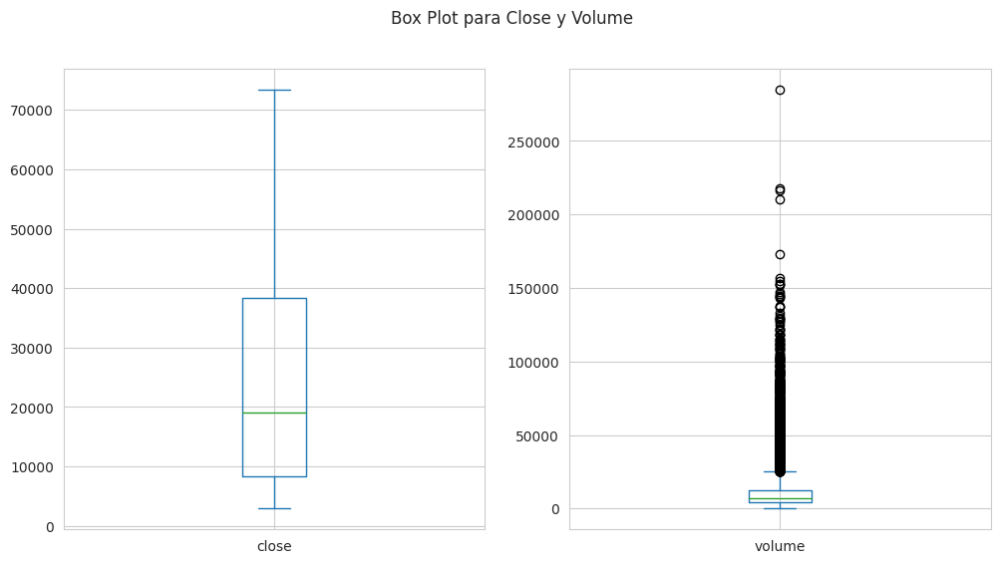

In [ ]:
# Crear una figura con subplots para 'close' y 'volume'
df_sin_nulos[['close', 'volume']].plot(kind='box',
                                          subplots=True,
                                          layout=(1, 2),  # 1 fila, 2 columnas
                                          sharex=False,
                                          sharey=False,
                                          figsize=(12, 6),
                                          title='Box Plot para Close y Volume')

# Mostrar el gráfico
plt.show()

La grafica de cajas para las variables "close" y "volume", indican lo siguiente:

Close:
La mediana está alrededor de 19051.7.
El 50% central de los datos se encuentra entre aproximadamente 8,000 y 38,000.
Hay algunos valores atípicos por encima, con el máximo cerca de 73,000.

volume:
La mediana es relativamente baja (6973.7).
El 50% central de los datos está muy concentrado en valores bajos.
Hay una gran cantidad de valores atípicos, con algunos extremos llegando hasta cerca de 275,000.

De acuerdo a lo anterior, mientras que los precios de cierre muestran una variabilidad moderada, el volumen presenta una variabilidad extrema con muchos días de volumen bajo y algunos días con volumen extremamente altos, esto evidencia la alta volatilidad que tiene este activo financiero.

**Gráficas de distribución**

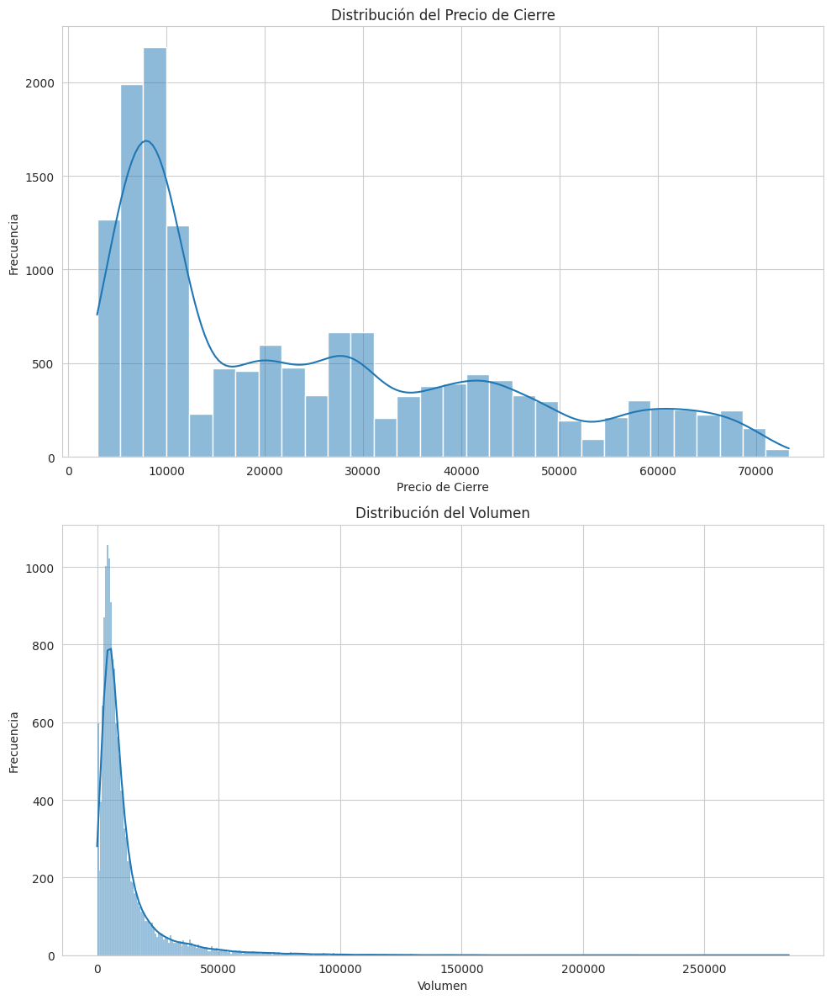

In [ ]:
# Configuración del estilo de seaborn
sns.set_style("whitegrid")

# Creando la figura con dos subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 12))

# Gráfico para 'close'
sns.histplot(df_sin_nulos['close'], kde=True, ax=ax1)
ax1.set_title('Distribución del Precio de Cierre')
ax1.set_xlabel('Precio de Cierre')
ax1.set_ylabel('Frecuencia')

# Gráfico para 'volume'
sns.histplot(df_sin_nulos['volume'], kde=True, ax=ax2)
ax2.set_title('Distribución del Volumen')
ax2.set_xlabel('Volumen')
ax2.set_ylabel('Frecuencia')

# Ajustar el diseño y mostrar el gráfico
plt.tight_layout()
plt.show()

Grafico de Close:
La distribución del precio de cierre tiene una asimetría positiva o sesgo a la derecha. Esto significa que la cola derecha de la distribución es más larga.
De igual manera la mayoria de los datos con frecuencias más altas se encuentran en el rango de precios entre los 10,000 a los 20,000, pero hay una cola hacia la derecha que se extiende hacia precios más altos, aunque con menor frecuencia.
Indicando que, aunque los precios altos han ocurrido, son menos frecuentes que los precios más bajos.

Gráfico de Volume:
La distribución del volumen también muestra asimetría positiva o sesgo a la derecha, pero de manera más extrema que el precio de cierre.
La mayoría de los volúmenes son bajos, con una larga cola que se extiende hacia volúmenes más altos.
Mostrando que los volúmenes extremadamente altos son raros, mientras los volúmenes bajos son comunes.
La curva está muy concentrada cerca de cero y se va desvaneciendo lentamente a medida que el volumen aumenta.

**Gráfico de pares (pair plot)**

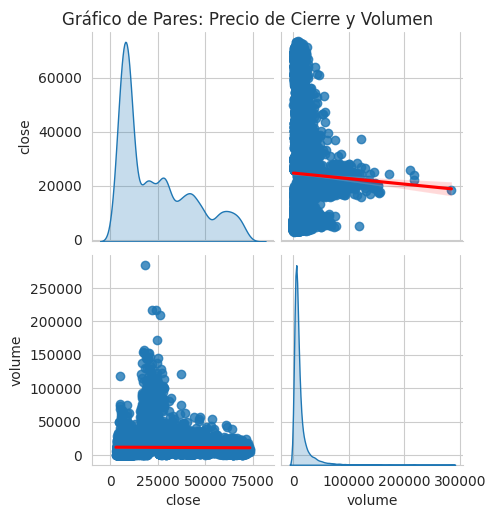

In [ ]:
sns.pairplot(df_sin_nulos[['close', 'volume']], kind='reg', diag_kind='kde', plot_kws={'line_kws':{'color':'red'}})
plt.suptitle('Gráfico de Pares: Precio de Cierre y Volumen', y=1.02)
plt.show()

En la grafica de pares para la variable close y volume donde se puede observar la relación entre estas dos variables y la distribución individual de cada una

Distribuciones Individuales:

Distribución de close:
* Se observa en el gráfico ubicado en parte superior izquierda un gráfico de densidad, donde la distribución es asimétrica a la derecha (sesgo positivo), con una gran concentración de la variable close en los rangos bajos, entre aproximadamente 0 y 25,000.

Distribución de volume:
* Se evidencia en el gráfico de la parte inferior derecha un grafico de densidad con una distribución de la variable volume, la cual es altamente asimétrica a la derecha, lo que indica que la mayoría de los volúmenes son bajos, con algunos volúmenes extremadamente altos reiterando el comportamiento arrojado por las graficas anteriores.

Relación entre close y volume:
* En los gráficos superior derecha e inferior izquierda, se muestra la relación entre la variable close y volume, esta relación muestra ser negativa, aunque no muy fuerte, ya que la línea de regresión (en rojo) tiene una pendiente ligeramente descendente.

* Los puntos están concentrados en las zonas de precios bajos y volúmenes bajos, con algunos puntos dispersos en los volúmenes más altos.

**Matriz de correlación**

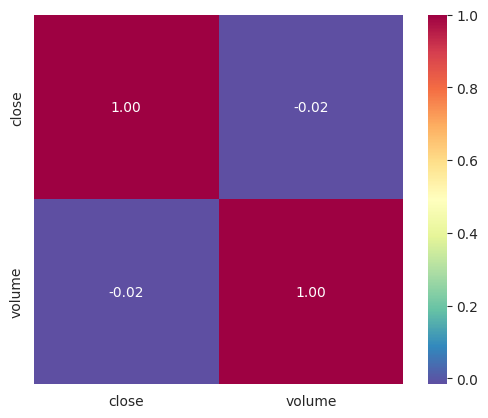

In [ ]:
# Correlacion entre variables

corrmat = df_sin_nulos[['close', 'volume']].corr()
hm = sns.heatmap(corrmat,
                 cbar=True,
                 annot=True,
                 square=True,
                 fmt='.2f',
                 annot_kws={'size': 10},
                 yticklabels=['close', 'volume'],
                 xticklabels=['close', 'volume'],
                 cmap="Spectral_r")
plt.show()

A partir del grafico de pares y de la matriz de correlacion, se puede decir que aunque existe una ligera correlación negativa entre las variables close y volume, no parece ser una relación lineal fuerte. Esto puede indicar que un aumento en el volumen no está necesariamente asociado con un aumento en el precio de cierre, y viceversa.

**Gráfica de serie de tiempo de close y volume**

<ipython-input-132-8999e8c6fee3>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sin_nulos.loc[:, 'fecha'] = df_sin_nulos.index


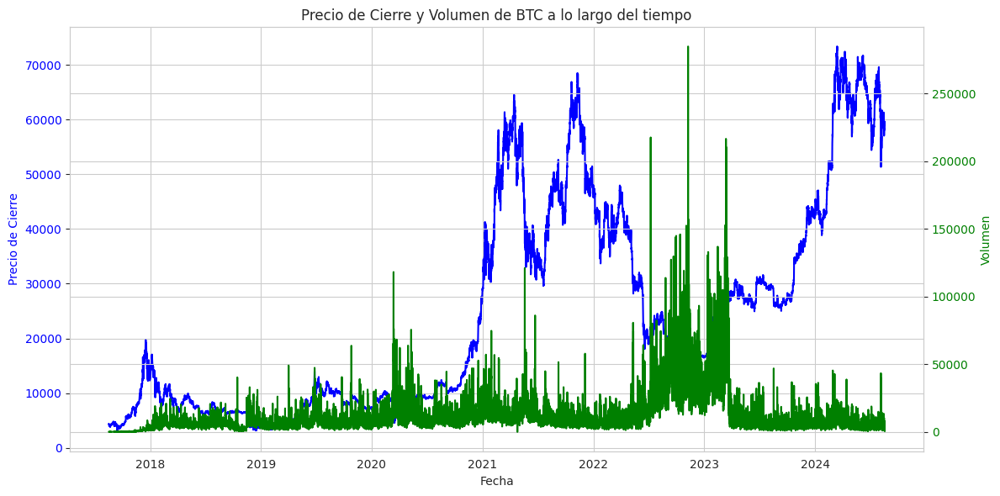

In [ ]:
# Crear una nueva columna para la fecha utilizando .loc
df_sin_nulos.loc[:, 'fecha'] = df_sin_nulos.index

# Crear la figura y el primer eje Y
fig, ax1 = plt.subplots(figsize=(12, 6))

# Graficar el precio de cierre en el primer eje Y (ax1)
ax1.plot(df_sin_nulos['fecha'], df_sin_nulos['close'], color='blue', label='Close')
ax1.set_xlabel('Fecha')
ax1.set_ylabel('Precio de Cierre', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.grid(True)

# Crear un segundo eje Y que comparte el mismo eje X
ax2 = ax1.twinx()
ax2.plot(df_sin_nulos['fecha'], df_sin_nulos['volume'], color='green', label='Volume')
ax2.set_ylabel('Volumen', color='green')
ax2.tick_params(axis='y', labelcolor='green')

# Título y leyendas
plt.title('Precio de Cierre y Volumen de BTC a lo largo del tiempo')
fig.tight_layout()  # Ajusta el layout para que no se superpongan las etiquetas

plt.show()

La grafica anterior muestra una serie temporal que ilustra la evolución de la variable close (en azul) y la variable volume (en verde) de Bitcoin (BTC) a lo largo del tiempo, desde aproximadamente 2017 hasta 2024:

1. Evolución de close:

2017-2018: Se observa un gran pico en el precio de cierre a finales de 2017, alcanzando valores cercanos a los 20,000 USD, seguido de una corrección significativa en 2018.

2019-2020: El precio se mantiene relativamente estable, con fluctuaciones menores hasta 2020.

2021: Hay un repunte significativo en el precio, alcanzando un nuevo máximo histórico alrededor de los 60,000 USD en la primera mitad de 2021. Esto es seguido por una corrección en el precio a mediados del año.

2021-2022: El precio vuelve a subir hacia finales de 2021, alcanzando nuevamente niveles cercanos a los 60,000 USD antes de caer de manera constante en 2022.

2023-2024: Durante estos años, el precio experimenta una recuperación, aunque no alcanza los máximos anteriores.

2. Evolución del Volume:

Volumen y Precio: Se puede observar que los picos en el volumen de transacciones tienden a coincidir con momentos de gran volatilidad en el precio de cierre. Por ejemplo, antes de los grandes aumentos de precio, el volumen de transacciones aumenta significativamente, indicando un alto nivel de actividad en el mercado.

Picos Específicos: Durante los picos de precios en 2021, el volumen también muestra grandes picos, lo que sugiere una fuerte participación del mercado en estos periodos. Sin embargo, en algunos otros momentos, como en la segunda mitad de 2022 y 2023, hay un aumento en el volumen, pero no necesariamente una correlación directa con el aumento del precio.

**Descomposición de la serie de tiempo de la variable objetivo "close"**

Ademas del analisis exploratorio realizado en el Taller Analisis univariado, para el caso de la variable "close" que para este proyecto es la variable objetivo, y para asegurarse de llevar a cabo la preparación de los datos que garantice un mejor rendimiento de los modelos a implementar; se lleva a cabo la identificación de su comportamiento en cuanto a tendencia, estacionalidad y comportamiento aleatorio, y se evalua la autocorrelacion de dicha variable a partir de Autocorrelación ACF y Autocorrelación Parcial PACF:

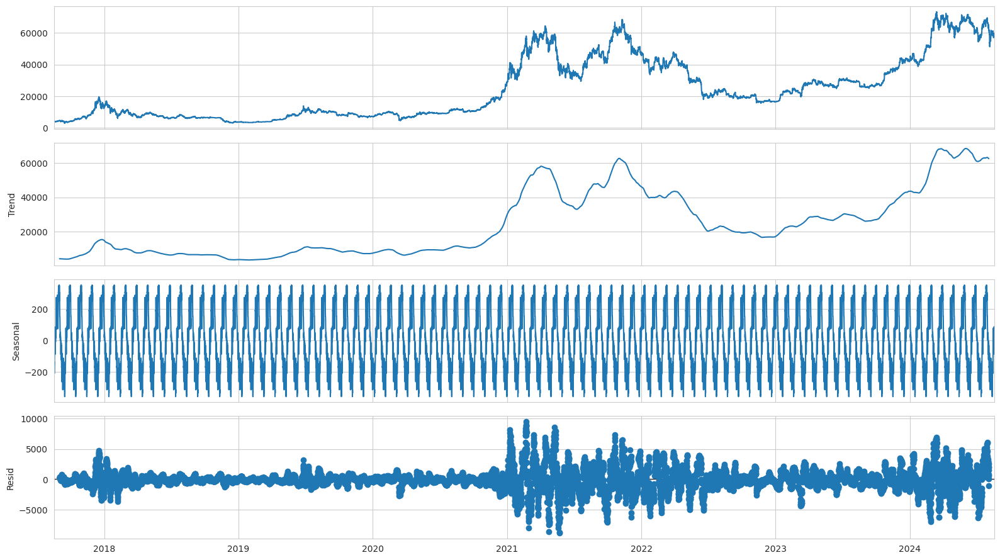

In [ ]:
# Conversión de timestamp a formato datetime
#df_sin_nulos['fecha'] = pd.to_datetime(df['timestamp'], unit='ms')
#Grafica de descomposicion del comportamiento de la variable "close"
periodo = 180
td_componentes = seasonal_decompose(df_sin_nulos[["close"]], model="additive", period=periodo)
fig = td_componentes.plot()
fig.set_size_inches((16, 9))
fig.tight_layout()
plt.show()

La grafica anterior muestra la descomposición de la serie temporal de close:

La primera grafica representa representa la serie temporal original de close a lo largo del tiempo, reflejando el comportamiento de esta en cada intervalo de tiempo; donde se puede observar varios ciclos de aumento y disminución en el precio de cierre o close del BTC. Hay períodos de crecimiento significativo seguidos de caídas abruptas.

La segunda grafica representa la tendencia, es decir la direccion subyacente a largo plazo del precio de cierre de BTC, donde filtra las fluctuaciones a corto plazo para identificar la tendencia general. De acuerdo a lo anterior la tendencia muestra un crecimiento inicial en los precios, seguido de una estabilización y un gran aumento posterior, después del aumento significativo, la tendencia comienza a disminuir ligeramente, lo que podría indicar una corrección en el mercado o un ajuste después de una fase fuerte del mercado.

Este componente es crucial para entender los ciclos de mercado a largo plazo y para identificar cuándo el mercado está en una fase de expansión (alcista) o contracción (bajista).

La tercer grafica representa la estacionalidad, la cual captura los patrones cíclicos y repetitivos en la serie de tiempo. En este caso la estacionalidad muestra un patrón regular y predecible que se repite a lo largo del tiempo, debido a que la serie esta a intervalos de 4 horas, estos ciclos podrían representar comportamientos intra-diarios o semanales que afectan el precio de cierre del BTC. Estos picos y valles regulares pueden indicar que estan asociados con horarios especificos del día en los que hay mayor actividad transaccional, influenciados por factores como la apertura y cierre de mercados o por eventos recurrentes que influyen en este mercado.

Finalmente la cuarta grafica muestra las irregularidades en los datos que no son capturados por la tendencia ni por la estacionalidad, en otras palabras estos pueden ser el ruido blanco, que no muestran patrones. Para el caso del comportamiento de la serie de tiempo de close se evidencia variabilidad con periodos de alta y baja volatilidad, los cuales no pueden ser explicados por patrones de tendencia y estacionalidad, y se puede diferir respecto a este comportamiento que factores como noticias economicas, eventos geopoliticos o comportamientos en otros mercados financieros, puede afectar el comportamiento del precio de cierre de BTC. Esta grafica proporciona información sobre la volatilidad no anticipada y presenta información para adecuar el modelo predictivo que capture este tipo de impactos externos.

**Autocorrelación (ACF) y autocorrelación parcial (PACF)**

<Figure size 640x480 with 0 Axes>

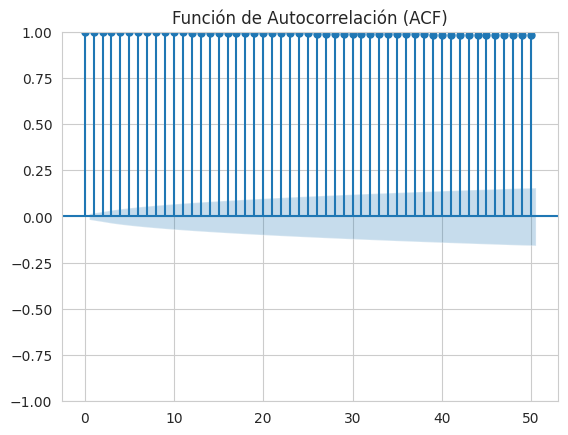

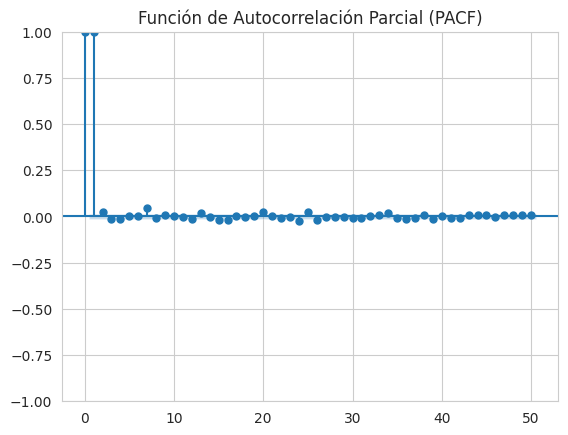

In [ ]:
plt.tight_layout()
plt.show()

# 2. Gráficos de Autocorrelación y Autocorrelación Parcial
# Esto ayuda a visualizar si hay autocorrelación en retardos específicos (indicando estacionalidad)
plot_acf(df_sin_nulos['close'], lags=50)
plt.title('Función de Autocorrelación (ACF)')
plt.show()

plot_pacf(df_sin_nulos['close'], lags=50)
plt.title('Función de Autocorrelación Parcial (PACF)')
plt.show()

A continuación se presenta la interpretación de Autocorrelación para la serie de tiempo de close:

Función de Autocorrelación (ACF)

Esta gráfica muestra cómo cada valor en la serie temporal está correlacionado con sus valores anteriores en diferentes retardos. Cada barra vertical representa la autocorrelación en un retardo específico. Para este caso se puede evidenciar que inicialmente existe una alta autocorrelación, ya que las barras de autocorrelación son muy altas y están por encima de la línea de significancia para casi todos los lags hasta al menos el lag 50, que en definitiva indica una fuerte autocorrelación persistente en los datos. Por otro lado como se evidencia que las barras no caen rapidamente hacia cero, esto puede indicar que la serie temporal es muy dependiente de sus valores pasados, mostrando una tendencia a largo plazo de los datos (capturando periodos prolongados de alta y baja volatilidad). El alto nivel de autocorrelación puede indicar que los cambios en el precio de cierre o close de BTC, esta influenciado por su comportamiento a lo largo de periodos extensos debido a factores macroeconomicos, noticias, regulaciones o comportamiento de los inversionistas en este mercado.


Función de Autocorrelación Parcial (PACF)

Esta gráfica muestra la correlación entre los valores de la serie temporal con sus retardos, pero eliminando la influencia de los valores intermedios. En otras palabras, muestra la correlación directa en cada lag una vez que se ha ajustado la influencia de los lags anteriores. De acuerdo a lo anterior en este caso para close el Lag 1 es significativo o en otras palabras la primera barra es muy alta, indicando una fuerte correlacion entre entre un valor y el valor inmediatamente anterior, reflejando que los close actuales estan fuertemente influenciados por los close del periodo anterior (4 horas antes). Ahora, tambien se puede identificar una disminución rápida después del primer lag y despues de esta, las correlaciones en PACF caen a cero y permanecen en ese nivel para los siguientes lags, lo que indica que, una vez que se tiene en cuenta el valor inmediatamente anterior, los otros lags no agregan mucha información adicional sobre la dependencia temporal. Dando un punto de partida de que se podria aplicar inicialmente un modelo AR para modelar dicha serie ya que sólo el primer valor de retardo tiene una relación significativa.

**Preparación de datos**

Ya con la información del comportamiento de la serie de tiempo de close, tanto de si existen patrones como de tendencia y estacionalidad y adicional el grado de autocorrelación entre la misma, a continuación se lleva a cabo la siguiente preparacion de los datos, teniendo en cuenta en dicho tratamiento, que las transformaciones que se hagan al dataframe no vayan a afectar negativamente este comportamiento inicial, cuando se corran en el modelo a implementar. La preparación de datos que se quiere llevar a cabo es la siguiente:

* Feature engineering: Para esta se va a crear variables nuevas a partir de las ya existentes, que se consideran importantes para continuar entendiendo los datos.
* Transformación de datos: de acuerdo a la naturaleza de los datos y la proyección de modelos que se espera implementar, se busca que dicha transformación no afecte la tendencia, estacionalidad y fuerte autocorrelación que tiene el dataframe original.
* Selección de las features: que aporten significativamente al rendimiento de los modelos proyectados.

FEATURE ENGINEERING

Con el fin de aprovechar este paso de preparación de datos para capturar patrones y tendencias en los datos históricos de close o precio de cierre de BTC, que aporten información util para la construcción de o los modelos predictivos o para realizar el analisis del mercado. Se plantea crear las siguientes features:

MEDIA MÓVIL

La media móvil es una herramienta de análisis técnico que suaviza las fluctuaciones de precio, facilitando la identificación de tendencias.

Se crea tanto la media movil de 3 periodos (moving_average_3), como la media movil de 7 periodos (moving_average_7), para este caso que cada periodo es de 4 horas, La media movil de 3 periodos utiliza los precios de cierre de las últimas 12 horas (3 períodos de 4 horas) para calcular su valor. Y para el caso de la media movil de 7 periodos utiliza los precios de cierre de los últimos 28 horas (7 períodos de 4 horas) para su cálculo. Esta ultima presenta un panorama mas a largo plazo de la tendencia del precio comparado con la media móvil de 3 períodos:

In [ ]:
# Aseguramos que df_sin_nulos sea una copia
df_tto = df_sin_nulos.copy()
# Media Móvil
df_tto['moving_average_3'] = df_tto['close'].rolling(window=3).mean()
df_tto['moving_average_7'] = df_tto['close'].rolling(window=7).mean()

VOLATILIDAD

Esta feature mide la volatilidad del precio de BTC en un periodo determinado. En otras palabras la volatilidad generalmente se calcula como la desviación estándar de los retornos de precios durante un período de tiempo específico. Para este caso se crearon las features volatility_3 la cual mide la volatilidad del precio de BTC en los últimos 3 períodos de 4 horas, es decir cuanto varia el precio en las ultimas 12 horas. De igual forma se creo la feature volatility_7 la cual mide la volatilidad del precio de BTC en los últimos 7 períodos de 4 horas, es decir cuanto varia el precio en las ultimas 12 horas. Esta ultima Proporciona una perspectiva de la variabilidad del precio en un rango de tiempo más amplio, comparado con volatility_3:

In [ ]:
# Volatilidad (se agrega como columnas)
df_tto['volatility_3'] = df_tto['close'].rolling(window=3).std()
df_tto['volatility_7'] = df_tto['close'].rolling(window=7).std()

RATIO DE CAMBIO

Finalmente la feature price_change, la cual indica el cambio porcentual en el precio de cierre entre períodos consecutivos de 4 horas. En otras palabras es una medida de la tasa de cambio del precio, que ayuda a evaluar si el precio está subiendo o bajando y en qué magnitud:

In [ ]:
# Ratio de Cambio (se agrega como columna)
df_tto['price_change'] = df_tto['close'].pct_change()

Ya creadas las features que se consideran relevantes para el proyecto, se visualiza a continuación en el dataframe:

In [ ]:
#Dataframe con las nuevas features
df_tto

,timestamp,close,volume,fecha,moving_average_3,moving_average_7,volatility_3,volatility_7,price_change
fecha,,,,,,,,,
2017-08-17 08:00:00,1.502957e+12,4427.30,63.619882,2017-08-17 08:00:00,NaN,NaN,NaN,NaN,NaN
2017-08-17 12:00:00,1.502971e+12,4352.34,174.562001,2017-08-17 12:00:00,NaN,NaN,NaN,NaN,-0.016931
2017-08-17 16:00:00,1.502986e+12,4325.23,225.109716,2017-08-17 16:00:00,4368.290000,NaN,52.871288,NaN,-0.006229
2017-08-17 20:00:00,1.503000e+12,4285.08,249.769913,2017-08-17 20:00:00,4320.883333,NaN,33.840021,NaN,-0.009283
2017-08-18 00:00:00,1.503014e+12,4292.39,276.193043,2017-08-18 00:00:00,4300.900000,NaN,21.385058,NaN,0.001706
...,...,...,...,...,...,...,...,...,...
2024-08-17 04:00:00,1.723867e+12,59248.00,1106.844530,2024-08-17 04:00:00,59093.656667,58841.772857,194.930120,564.486594,0.001515
2024-08-17 08:00:00,1.723882e+12,59137.12,1327.011360,2024-08-17 08:00:00,59181.163333,58938.934286,58.849347,545.429552,-0.001871
2024-08-17 12:00:00,1.723896e+12,59388.11,1490.864120,2024-08-17 12:00:00,59257.743333,59080.092857,125.778354,509.376881,0.004244


**Transformación de los datos**

De acuerdo al Taller de preparación de datos, se evidencio que la transformación que obtuvo el mejor MSE y RMSE (aplicando modelos ARIMA y SARIMA), fue la transformación Min-Max Scaling, por lo anterior a continuación se procede a realizar dicha normalización:

In [ ]:
from sklearn.preprocessing import MinMaxScaler

# Crear una copia del DataFrame df_tto
df_normalized = df_tto.copy()

# Seleccionar solo las columnas numéricas que no sean 'timestamp'
columns_selec = [col for col in df_normalized.select_dtypes(include=['float64', 'int64']).columns if col != 'timestamp']

# Crear una instancia del MinMaxScaler
min_max_scaler = MinMaxScaler()

# Aplicar Min-Max Scaling a todas las columnas numéricas en df_normalized
df_normalized[columns_selec] = min_max_scaler.fit_transform(df_normalized[columns_selec])

# Imprimir los valores mínimos y máximos después de la normalización
print("\nValores después de la normalización:")
print(df_normalized[columns_selec].describe())


Valores después de la normalización:
              close        volume  moving_average_3  moving_average_7  \
count  15330.000000  15330.000000      15328.000000      15324.000000   
mean       0.305304      0.041076          0.303564          0.303543   
std        0.270543      0.053622          0.271827          0.272619   
min        0.000000      0.000000          0.000000          0.000000   
25%        0.075794      0.014495          0.072797          0.072004   
50%        0.229059      0.024494          0.226955          0.226963   
75%        0.502105      0.044131          0.501669          0.501945   
max        1.000000      1.000000          1.000000          1.000000   

       volatility_3  volatility_7  price_change  
count  15328.000000  15324.000000  15329.000000  
mean       0.061942      0.077261      0.396970  
std        0.086370      0.094257      0.030426  
min        0.000000      0.000000      0.000000  
25%        0.011136      0.016722      0.386658  
50% 

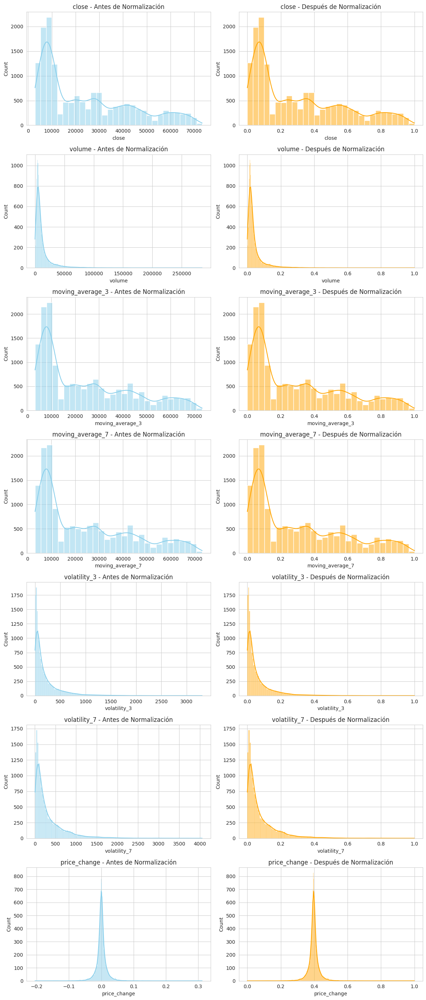

In [ ]:
# Visualización de la normalización
fig, axes = plt.subplots(nrows=len(columns_selec), ncols=2, figsize=(12, 4 * len(columns_selec)))

for i, column in enumerate(columns_selec):
    # Gráfico de distribución antes de la normalización usando df_original
    sns.histplot(df_tto[column], ax=axes[i, 0], kde=True, color='skyblue')
    axes[i, 0].set_title(f'{column} - Antes de Normalización')

    # Gráfico de distribución después de la normalización usando df_normalized
    sns.histplot(df_normalized[column], ax=axes[i, 1], kde=True, color='orange')
    axes[i, 1].set_title(f'{column} - Después de Normalización')

plt.tight_layout()
plt.show()

FEATURE SELECTION

De acuerdo a literatura existen varios tipos de feature selection, entre estos y los que se aplicaran en este proyecto son:

* Correlación de pearson
* Selección de características basada en árboles (Importancia de características)
* Recursive Feature Elimination (RFE)

Para llevar a cabo este paso, primero se adecua el dataframe a continuación:

In [ ]:
# Crear un DataFrame de características y la variable objetivo
features = df_normalized.drop(columns=['close', 'fecha', 'timestamp'])
target = df_normalized['close']

CORRELACION DE PEARSON

Esta técnica calcula la correlación de Pearson entre cada característica y la variable objetivo que para este caso es close; para identificar características que están altamente correlacionadas con dicha variable:

Correlación de Pearson con la variable objetivo:
close               1.000000
moving_average_3    0.999860
moving_average_7    0.999527
timestamp           0.734236
volatility_7        0.615223
volatility_3        0.533752
price_change        0.005583
volume             -0.016385
Name: close, dtype: float64


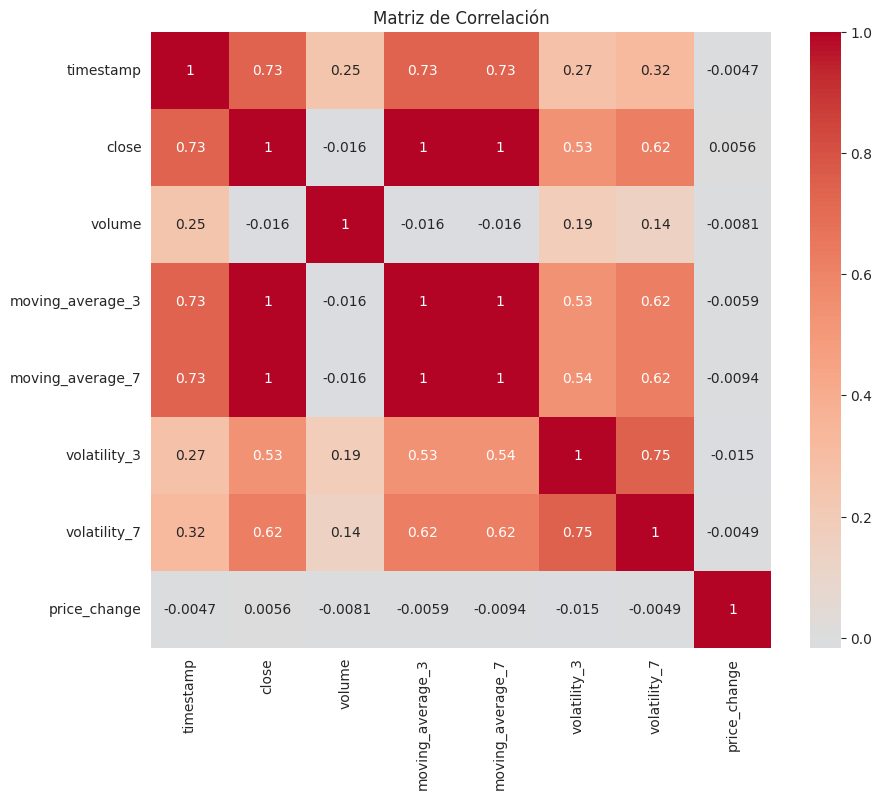

In [ ]:
# Seleccionar solo las columnas numéricas
df_numeric = df_normalized.select_dtypes(include=['number'])

# Calcular la correlación solo para las columnas numéricas
correlation_matrix = df_numeric.corr()
correlation_target = correlation_matrix['close'].sort_values(ascending=False)

print("Correlación de Pearson con la variable objetivo:")
print(correlation_target)

# Visualización de la matriz de correlación
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Matriz de Correlación')
plt.show()

De acuerdo a la matriz de correlación, existe una muy alta correlación entre las medias moviles y la variable close que es la variable objetivo, indicando que al tener alta correlación, dichas medias moviles pueden estar redundando información o en otras palabras no estaria aportando información diferente a la varible close, por ende parecen no ser relevantes para un modelo futuro. Ahora, con respecto a la volatilidad 3 y 7 se puede identificar una correlación moderada, lo que indica que, aunque existe cierta relación, no es suficientemente fuerte como para que la volatilidad sea un predictor clave del precio en sí. Esta variable es mas objetiva cuando se intenta modelar riesgos o incertidumbres en un mercado. Sin embargo, para la predicción directa del precio de cierre, la volatilidad no es una variable central. Finalmente se puede observar que la correlación de close con price_change y volume es baja a casi nula.



SELECCION DE CARACTERISTICAS BASADA EN ARBOLES

Para esta técnica se puede utilizar por ejemplo un modelo basado en árboles como RandomForestRegressor para evaluar la importancia de cada característica (features). A continuación se presenta el desarrollo de esta técnica:

In [ ]:
from sklearn.impute import SimpleImputer

# Filtrar solo columnas numéricas
features_numeric = features.select_dtypes(include=['number'])

# Imputación de valores faltantes
imputer = SimpleImputer(strategy='mean')  # Crear un imputador que reemplace los NaN por la media de cada columna
features_imputed = imputer.fit_transform(features_numeric)  # Aplicar la imputación a las características numéricas

# Ajustar un modelo RandomForest para evaluar la importancia de las características
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(features_imputed, target)

RandomForestRegressor(random_state=42)


Importancia de las características:
moving_average_3    0.999694
price_change        0.000170
volume              0.000076
volatility_3        0.000041
moving_average_7    0.000010
volatility_7        0.000009
dtype: float64


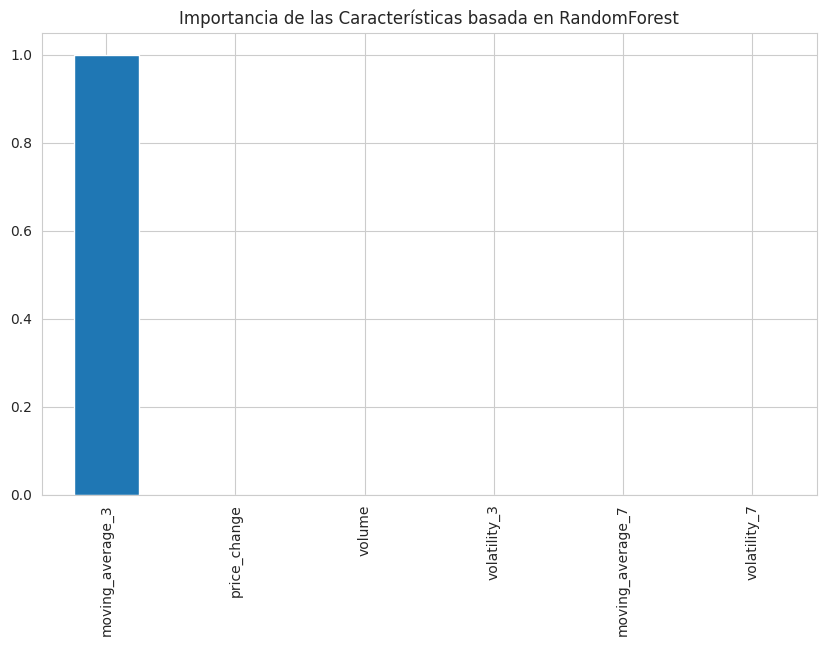

In [ ]:
# Obtener la importancia de las características
feature_importances = pd.Series(rf_model.feature_importances_, index=features.columns)
feature_importances = feature_importances.sort_values(ascending=False)

print("\nImportancia de las características:")
print(feature_importances)

# Visualización de la importancia de las características
plt.figure(figsize=(10, 6))
feature_importances.plot(kind='bar')
plt.title('Importancia de las Características basada en RandomForest')
plt.show()

La barra correspondiente a moving_average_3 tiene un valor de importancia de aproximadamente 1.0, indicando que esta característica o feature tiene una importancia significativa en el modelo. En otras palabras moving_average_3 es la característica más predictiva para el valor objetivo en comparación con las demás características.

RECURSIVE FEATURE ELIMINATION (RFE)

Esta tecnica selecciona características eliminando recursivamente las menos importantes. Iniciando a entrenar el modelo con todas las características y posteriormente evaluando la importancia de cada característica y eliminando las de menor importancia, este proceso lo repite hasta alcanzar un número deseado de características seleccionadas. A continuación se presenta el desarrollo de la tecnica en mención:

In [ ]:
from sklearn.linear_model import LinearRegression

# Convertir los datos imputados de nuevo a un DataFrame para usar nombres de columnas
features_imputed_df = pd.DataFrame(features_imputed, columns=features.columns)

# Utilizar un modelo de regresión lineal para RFE
lr_model = LinearRegression()
rfe = RFE(estimator=lr_model, n_features_to_select=5)
rfe.fit(features_imputed_df, target)

# Obtener las características seleccionadas
selected_features = features_imputed_df.columns[rfe.support_]

print("\nCaracterísticas seleccionadas por RFE:")
print(selected_features)

# Filtrar las características seleccionadas para usarlas en un modelo posterior
features_selected = features_imputed_df[selected_features]


Características seleccionadas por RFE:
Index(['moving_average_3', 'moving_average_7', 'volatility_3', 'volatility_7',
       'price_change'],
      dtype='object')


De acuerdo a lo anterior el RFE identifico que la combinación de medias móviles y medidas de volatilidad, junto con el cambio de precio, son las características más relevantes para predecir la variable objetivo. Ya que estas caracteristicas capturan tanto la tendencia como la variabilidad de los precios.


Sin embargo debido a que dos de los tres metodos de feature selection indican poca favorabilidad en el uso de las variables que el metodo REF indica como relevantes, se puede concluir que las features con las que se cuentan, tienen alta probabilidad de no aportar significativamente en la predicción del precio de cierre o close, tanto como ella misma teniendo en cuenta su alta autocorrelación.

Por lo anterior se procede a implementar un modelo de predicción de series de tiempo donde solo se involucrara la variable close (modelo entre la misma variable en diferentes periodos de tiempo):

**Modelo Prophet**

A continuación se procede a implementar el modelo Prophet, usando como datos la dataframe normalizada df_normalized. De igual forma se crean las variables "y" que sale a partir de la variable objetivo "close" y "ds" que sale de la variable "fecha" tal como las requiere el modelo:

In [ ]:
df_normalized['ds'] = pd.to_datetime(df_normalized['timestamp'], unit='ms')  # Convertir 'timestamp' a formato de fecha
df_normalized = df_normalized.rename(columns={'close': 'y'})  # Renombrar 'close' a 'y'
df_normalized = df_normalized.drop('timestamp', axis=1)  # Eliminar la columna 'timestamp'

# Mostrar el DataFrame actualizado
df_normalized

,y,volume,fecha,moving_average_3,moving_average_7,volatility_3,volatility_7,price_change,ds
fecha,,,,,,,,,
2017-08-17 08:00:00,0.021416,0.000223,2017-08-17 08:00:00,NaN,NaN,NaN,NaN,NaN,2017-08-17 08:00:00
2017-08-17 12:00:00,0.020351,0.000613,2017-08-17 12:00:00,NaN,NaN,NaN,NaN,0.363657,2017-08-17 12:00:00
2017-08-17 16:00:00,0.019966,0.000791,2017-08-17 16:00:00,0.017445,NaN,0.015929,NaN,0.384356,2017-08-17 16:00:00
2017-08-17 20:00:00,0.019396,0.000877,2017-08-17 20:00:00,0.016769,NaN,0.010174,NaN,0.378450,2017-08-17 20:00:00
2017-08-18 00:00:00,0.019500,0.000970,2017-08-18 00:00:00,0.016484,NaN,0.006407,NaN,0.399702,2017-08-18 00:00:00
...,...,...,...,...,...,...,...,...,...
2024-08-17 04:00:00,0.799784,0.003888,2024-08-17 04:00:00,0.798300,0.796309,0.058886,0.138462,0.399333,2024-08-17 04:00:00
2024-08-17 08:00:00,0.798210,0.004661,2024-08-17 08:00:00,0.799549,0.797699,0.017736,0.133759,0.392784,2024-08-17 08:00:00
2024-08-17 12:00:00,0.801774,0.005236,2024-08-17 12:00:00,0.800641,0.799720,0.037975,0.124863,0.404611,2024-08-17 12:00:00


TRAIN, TEST SPLIT

Se fracciona la dataframe en data para entrenamiento y data de test:

In [ ]:
# Calcular el índice de separación

porcentaje_split = 0.99
split_index = int(len(df) * porcentaje_split)

# Dividir el DataFrame en conjuntos de entrenamiento y prueba
train =df_normalized.iloc[:split_index]
test = df_normalized.iloc[split_index:]

periodos = len(test)

A continuación se procede a correr el modelo con los datos de entrenamiento, para finalmente obtener los datos predichos para los meses de agosto a diciembre de 2024 en una temporalidad de 4 horas.

In [ ]:
m = Prophet()
m.fit(train)

DEBUG:cmdstanpy:input tempfile: /tmp/tmpse07r1_x/czzoqvep.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpse07r1_x/b8h5kpcf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=39475', 'data', 'file=/tmp/tmpse07r1_x/czzoqvep.json', 'init=/tmp/tmpse07r1_x/b8h5kpcf.json', 'output', 'file=/tmp/tmpse07r1_x/prophet_modelbkkoqhp6/prophet_model-20240906155934.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:59:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:59:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [ ]:

future = m.make_future_dataframe(periods=periodos)
future.head()

,ds
0,2017-08-17 08:00:00
1,2017-08-17 12:00:00
2,2017-08-17 16:00:00
3,2017-08-17 20:00:00
4,2017-08-18 00:00:00


In [ ]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()



,ds,yhat,yhat_lower,yhat_upper
15325,2024-12-06 20:00:00,1.032089,0.746337,1.308118
15326,2024-12-07 20:00:00,1.034684,0.732648,1.305243
15327,2024-12-08 20:00:00,1.037112,0.724601,1.314335
15328,2024-12-09 20:00:00,1.040758,0.747233,1.350527
15329,2024-12-10 20:00:00,1.042666,0.719117,1.335677


In [ ]:
plot_plotly(m, forecast)

/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  v = v.dt.to_pydatetime()


La gáfica anterior muestra la predicción desde agosto hasta diciembre de 2024, pero con una incertidumbre creciente, como se observa en el área sombreada. De igual forma el intervalo de confianza se va ensanchando a medida que avanza en el futuro indicando que el modelo es menos seguro sobre las predicciones más alejadas en el tiempo.

In [ ]:
plot_components_plotly(m, forecast)



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/usr/local/lib/python3.10/dist-packages/

En la grafica anterior se puede evidenciar que close tiene
fluctuaciones importantes en los últimos años, con una tendencia alcista proyectada para 2024-2025. De igual forma este tiende en la temporalidad anual subir hacia mediados del año (mayo-junio) y cae a partir de septiembre, con otro aumento hacia fin de año. En cuanto a la temporalidad semanal los dias laborales entre martes y viernes, muestran más actividad, con un descenso notable durante el domingo, y finalmente en temporalidad diaria la mayor actividad ocurre alrededor de las 21:00, seguido de una caída.

**Evaluación del modelo**

En función de lo anterior se procede a evaluar el rendimiento del modelo a partir del RMSE, donde se puede identificar que este es muy bajo en relación con el valor medio del dataset (0.831), indicando que el modelo funciona bien, haciendo predicciones cercanas a los valores reales.

In [ ]:
# Calcular RMSE
predictions = forecast.iloc[-periodos:]['yhat']
rmse_value = rmse(predictions, test['y'])
mean_test_value = test['y'].mean()

print("RMSE: ", rmse_value)
print("Valores medios del datasets: ", mean_test_value)

RMSE:  0.13082920645763682
Valores medios del datasets:  0.8312045376029354


A pesar del resultado obtenido, a continuación se aplica ajuste de hiperparametros al modelo para mejorar su rendimiento:

**Ajustando Hiperparametros**

In [ ]:
# Configuración de hiperparámetros a probar
param_grid = {
    'seasonality_mode': ['additive', 'multiplicative'],
    'changepoint_prior_scale': [0.001, 0.01, 0.1, 0.5],
    'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0],
    'yearly_seasonality': [True, False],
    'weekly_seasonality': [True, False],
}

# Lista para almacenar resultados
results = []

# Búsqueda en cuadrícula
for seasonality_mode in param_grid['seasonality_mode']:
    for changepoint_prior_scale in param_grid['changepoint_prior_scale']:
        for seasonality_prior_scale in param_grid['seasonality_prior_scale']:
            for yearly_seasonality in param_grid['yearly_seasonality']:
                for weekly_seasonality in param_grid['weekly_seasonality']:

                    # Inicializar el modelo con los parámetros actuales
                    model = Prophet(
                        seasonality_mode=seasonality_mode,
                        changepoint_prior_scale=changepoint_prior_scale,
                        seasonality_prior_scale=seasonality_prior_scale,
                        yearly_seasonality=yearly_seasonality,
                        weekly_seasonality=weekly_seasonality,
                    )

                    # Ajustar el modelo con los datos de entrenamiento
                    model.fit(train)

                    # Crear un DataFrame para futuras predicciones
                    future = model.make_future_dataframe(periods=len(test))
                    forecast = model.predict(future)

                    # Calcular RMSE
                    predictions = forecast.iloc[-len(test):]['yhat']
                    error = rmse(predictions, test['y'])

                    # Almacenar los resultados
                    results.append({
                        'seasonality_mode': seasonality_mode,
                        'changepoint_prior_scale': changepoint_prior_scale,
                        'seasonality_prior_scale': seasonality_prior_scale,
                        'yearly_seasonality': yearly_seasonality,
                        'weekly_seasonality': weekly_seasonality,
                        'rmse': error
                    })

# Convertir los resultados en un DataFrame y ordenarlos por RMSE
results_df = pd.DataFrame(results)
best_result = results_df.sort_values(by='rmse').iloc[0]
best_result

DEBUG:cmdstanpy:input tempfile: /tmp/tmpse07r1_x/14meql9s.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpse07r1_x/pegrd6pi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=192', 'data', 'file=/tmp/tmpse07r1_x/14meql9s.json', 'init=/tmp/tmpse07r1_x/pegrd6pi.json', 'output', 'file=/tmp/tmpse07r1_x/prophet_modelk2t3h21d/prophet_model-20240906161637.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:16:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:16:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpse07r1_x/36bpgsbz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpse07r1_x/775nhw7f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/li

,112
seasonality_mode,multiplicative
changepoint_prior_scale,0.5
seasonality_prior_scale,0.01
yearly_seasonality,True
weekly_seasonality,True
rmse,0.064394


Con la implementación del ajuste de hiperparametros se pudo evidencia que el RMSE paso de 0.130829 a 0.064394, evidenciando un buen resultado a partir de dicho ajuste, sin embargo a continuación aplicamos un nuevo ajuste para identificar si se logra bajar el RMSE:

In [ ]:
# Ajuste fino alrededor de los mejores hiperparámetros iniciales
param_grid_fine = {
    'seasonality_mode': ['multiplicative'],  # Usamos el mejor modo encontrado
    'changepoint_prior_scale': [0.4, 0.5, 0.6],  # Ajuste fino alrededor de 0.5
    'seasonality_prior_scale': [0.008, 0.01, 0.012],    # Ajuste fino alrededor de 0.1
    'yearly_seasonality': [True],
    'weekly_seasonality': [True],
}

# Lista para almacenar resultados
results_fine = []

# Búsqueda en cuadrícula fina
for changepoint_prior_scale in param_grid_fine['changepoint_prior_scale']:
    for seasonality_prior_scale in param_grid_fine['seasonality_prior_scale']:

        # Inicializar el modelo con los parámetros actuales
        model = Prophet(
            seasonality_mode=param_grid_fine['seasonality_mode'][0],
            changepoint_prior_scale=changepoint_prior_scale,
            seasonality_prior_scale=seasonality_prior_scale,
            yearly_seasonality=param_grid_fine['yearly_seasonality'][0],
            weekly_seasonality=param_grid_fine['weekly_seasonality'][0],
        )

        # Ajustar el modelo con los datos de entrenamiento
        model.fit(train)

        # Crear un DataFrame para futuras predicciones
        future = model.make_future_dataframe(periods=len(test))
        forecast = model.predict(future)

        # Calcular RMSE
        predictions = forecast.iloc[-len(test):]['yhat']
        error = rmse(predictions, test['y'])

        # Almacenar los resultados
        results_fine.append({
            'changepoint_prior_scale': changepoint_prior_scale,
            'seasonality_prior_scale': seasonality_prior_scale,
            'rmse': error
        })

# Convertir los resultados en un DataFrame y ordenarlos por RMSE
results_fine_df = pd.DataFrame(results_fine)
best_result_fine = results_fine_df.sort_values(by='rmse').iloc[0]
best_result_fine

DEBUG:cmdstanpy:input tempfile: /tmp/tmpse07r1_x/sf9ulb_8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpse07r1_x/quhj28ff.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=6400', 'data', 'file=/tmp/tmpse07r1_x/sf9ulb_8.json', 'init=/tmp/tmpse07r1_x/quhj28ff.json', 'output', 'file=/tmp/tmpse07r1_x/prophet_models92em8wy/prophet_model-20240906171354.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:13:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:14:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpse07r1_x/gcvte12q.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpse07r1_x/pqzo919u.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

,4
changepoint_prior_scale,0.500000
seasonality_prior_scale,0.010000
rmse,0.064394


A partir de la implementación del nuevo ajuste se evidencio que no afecto el RMSE del ajuste de hiperm parametros inicial. A continuación se procede a correr los datos en el modelo con el ajuste de hiperparametros:

In [ ]:
# Calcular el índice de separación
split_index = int(len(df_normalized) * 0.99)
train = df_normalized.iloc[:split_index]
test = df_normalized.iloc[split_index:]

# Inicializar el mejor modelo basado en la búsqueda de hiperparámetros
model = Prophet(
    seasonality_mode='multiplicative',
    changepoint_prior_scale=0.5,
    seasonality_prior_scale=0.01,
    yearly_seasonality=True,
    weekly_seasonality=True
)

# Ajustar el modelo con los datos de entrenamiento
model.fit(train)

# Crear un DataFrame para futuras predicciones
future = model.make_future_dataframe(periods=len(test))
forecast = model.predict(future)



DEBUG:cmdstanpy:input tempfile: /tmp/tmpse07r1_x/xu400_h6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpse07r1_x/hbechdw0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=73909', 'data', 'file=/tmp/tmpse07r1_x/xu400_h6.json', 'init=/tmp/tmpse07r1_x/hbechdw0.json', 'output', 'file=/tmp/tmpse07r1_x/prophet_modely_b1yu86/prophet_model-20240906174819.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:48:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:48:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [ ]:
# Visualización de Predicciones
# Plotly: gráfico interactivo
plot_plotly(model, forecast)



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



Con el ajuste de hiperparámetros, el modelo muestra ser más preciso, ya que el intervalo de confianza es más estrecho y las predicciones a futuro son más suaves y menos volátiles. En cuanto al intervalo de confianza al ser más estrecho indica que el ajuste ha reducido la incertidumbre en las predicciones, lo que es una señal de que el modelo está mejor ajustado.


La tendencia hacia 2024-2025 se ha suavizado, indicando que el modelo ha aprendido mejor los patrones subyacentes y ahora hace predicciones más confiables.

In [ ]:
# Visualización de Componentes del Modelo
plot_components_plotly(model, forecast)



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



El modelo con ajuste de hiperparametros presenta una subida más suave en el futuro (2024-2025), con menos fluctuaciones; indicando que este ajuste reduce la volatilidad de las predicciones. El patrón estacional anual sigue siendo claro, pero la curva ha sido suavizada, indicando que el modelo capta bien los patrones anuales sin sobreajustarse a fluctuaciones menores. Con respecto a la grafica semanal tambien son menos pronunciadas en comparación con el modelo sin ajustes, indicando una mayor estabilidad en las predicciones a lo largo de la semana y finalmente para la grafica diaria el pico mas alto sigue siendo a las 21:00 pero la curva es mas suave, indicando que el modelo a eliminado ruido en temporalidad diaria.

**Responder la pregunta SMART**

Con el fin de proceder a dar respuesta a la pregunta SMART del proyecto final, se procede a filtrar el mes de agosto que es el mes del que se quiere realizar la predicción del precio de cierre o close y posteriormente se procede con la  desnormalizar de los datos predichos:

**Filtrar el periodo requerido**

In [ ]:
# Aumentar el número de períodos para asegurar cubrir todo el mes de agosto
future = m.make_future_dataframe(periods=60, freq='D')  # freq='D' asegura que las fechas sean diarias
forecast = m.predict(future)

# Extraer las columnas necesarias del DataFrame de predicciones
df_final_predicciones = forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

# Filtrar las predicciones para el mes de agosto de 2024
start_date = '2024-08-01'
end_date = '2024-08-31'
predicciones_agosto_2024 = df_final_predicciones[(df_final_predicciones['ds'] >= start_date) & (df_final_predicciones['ds'] <= end_date)]

# Mostrar las predicciones del mes de agosto de 2024, incluido el 31 de agosto
predicciones_agosto_2024

,ds,yhat,yhat_lower,yhat_upper
15198,2024-08-01 20:00:00,0.881752,0.830949,0.932044
15199,2024-08-02 20:00:00,0.882881,0.835713,0.932047
15200,2024-08-03 20:00:00,0.884314,0.837657,0.938308
15201,2024-08-04 20:00:00,0.885454,0.834148,0.934518
15202,2024-08-05 20:00:00,0.887665,0.839003,0.940857
15203,2024-08-06 20:00:00,0.887972,0.839538,0.939011
15204,2024-08-07 20:00:00,0.889617,0.840376,0.939677
15205,2024-08-08 20:00:00,0.888954,0.837523,0.939040
15206,2024-08-09 20:00:00,0.889263,0.839547,0.942507
15207,2024-08-10 20:00:00,0.889854,0.838335,0.937688


**Desnormalizar los datos predichos**

Para este paso se aplica la tecnica de desnormalizar la normalización de Min-Max scaler que se aplico en la preparación de datos:

In [ ]:
# Obtener los valores mínimo y máximo del MinMaxScaler
min_value = min_max_scaler.data_min_[0]  # Este es el valor mínimo para la columna 'close'
max_value = min_max_scaler.data_max_[0]  # Este es el valor máximo para la columna 'close'

# Desnormalizar las predicciones para el mes de agosto de 2024 utilizando .loc
predicciones_agosto_2024.loc[:, 'yhat_desnormalizado'] = predicciones_agosto_2024['yhat'] * (max_value - min_value) + min_value
predicciones_agosto_2024.loc[:, 'yhat_lower_desnormalizado'] = predicciones_agosto_2024['yhat_lower'] * (max_value - min_value) + min_value
predicciones_agosto_2024.loc[:, 'yhat_upper_desnormalizado'] = predicciones_agosto_2024['yhat_upper'] * (max_value - min_value) + min_value

# Mostrar el DataFrame final con las predicciones desnormalizadas para agosto de 2024
predicciones_agosto_2024[['ds', 'yhat_desnormalizado', 'yhat_lower_desnormalizado', 'yhat_upper_desnormalizado']].tail()

,ds,yhat_desnormalizado,yhat_lower_desnormalizado,yhat_upper_desnormalizado
15223,2024-08-26 20:00:00,65302.905197,61060.149333,68863.428274
15224,2024-08-27 20:00:00,65214.264640,61040.479908,69314.100359
15225,2024-08-28 20:00:00,65229.030985,61218.209812,69497.508703
15226,2024-08-29 20:00:00,65090.711059,60954.126636,69477.709135
15227,2024-08-30 20:00:00,65030.553852,61087.108560,69784.416508


**Identificar el Porcentaje de asertividad**

In [ ]:
# Fecha y valor real de BTC
fecha_real = pd.to_datetime('2024-08-30')  # Convertir a formato datetime
valor_real_btc = 58973  # Valor real de BTC para el 30 de agosto de 2024

# Asegurarse de que la columna 'ds' está en formato datetime solo con fecha (sin hora)
predicciones_agosto_2024.loc[:, 'ds'] = pd.to_datetime(predicciones_agosto_2024['ds']).dt.date
fecha_real = fecha_real.date()  # Solo la parte de la fecha

# Filtrar las predicciones para el 30 de agosto de 2024
prediccion_30_agosto = predicciones_agosto_2024[predicciones_agosto_2024['ds'] == fecha_real]

# Verificar si hay datos para esa fecha
if not prediccion_30_agosto.empty:
    # Extraer la predicción central (yhat_desnormalizado) para el 30 de agosto de 2024
    yhat_pred = prediccion_30_agosto['yhat_desnormalizado'].values[0]

    # Calcular la diferencia absoluta entre la predicción y el valor real
    diferencia_absoluta = abs(yhat_pred - valor_real_btc)

    # Calcular el porcentaje de asertividad
    asertividad = 100 - (diferencia_absoluta / valor_real_btc) * 100

    # Mostrar el porcentaje de asertividad
    print(f"El porcentaje de asertividad del modelo para el 30 de agosto de 2024 es: {asertividad:.2f}%")
else:
    print(f"No se encontraron predicciones para la fecha {fecha_real}. Verifica el rango de fechas del modelo.")


El porcentaje de asertividad del modelo para el 30 de agosto de 2024 es: 89.73%


**Conclusiones**

Con base en los resultados obtenidos, el modelo predijo el precio de cierre o close del BTC para el 30 de agosto de 2024 con un 89.73% de asertividad, difiriendo del 90% proyectado en la pregunta SMART en un 0.27%. Mostrando además que el ajuste de hiperparámetros mejoró la precisión y redujo la volatilidad de las predicciones.

De igual forma el modelo muestra un crecimiento hacia el futuro y la incertidumbre sigue presente, por lo que las predicciones deben interpretarse con mayor prudencia, especialmente en horizontes temporales más alejados.